In [17]:
! nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2017 NVIDIA Corporation
Built on Fri_Sep__1_21:08:03_CDT_2017
Cuda compilation tools, release 9.0, V9.0.176


In [ ]:
import coco, glob, h5py, itertools, json, logging, math, matplotlib, os, PIL, random, re, skimage, sys, time, torch
import matplotlib
import matplotlib.lines as lines
import matplotlib.patches as patches
from matplotlib.patches import Polygon
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch.utils.data

from azure.storage import CloudStorageAccount
from azure.storage.blob import BlockBlobService
from collections import OrderedDict
from PIL import Image, ImageOps
from skimage import draw
from torch.autograd import Variable
from torchvision import datasets

# Import Mask R-CNN
TOP_DIR = os.path.abspath("../")
sys.path.append(TOP_DIR)
import utils, visualize
import model as modellib

from config import Config
from model import log

In [19]:
%matplotlib inline

In [20]:
%run AzureStorageHelper.ipynb

In [21]:
# Root directory of the project
TOP_DIR = os.path.abspath("../")

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory of images to run detection on
DATA_DIR = os.path.join(ROOT_DIR, "frames")

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

## Notebook Preferences

In [22]:
def get_ax(rows=1, cols=1, size=8):
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

### List Training Runs

In [23]:
list_files(model_weights_share)

mask_rcnn_coco.pth
fish20180618T2332
fish20180619T0448
fish20180619T0622
fish20180619T1243
fish20180619T1327
fish20180628T1302


### List Model Weights

In [24]:
folder = 'fish20180628T1302'

list_files(model_weights_share, folder)

mask_rcnn_fish_0001.pth
mask_rcnn_fish_0002.pth
mask_rcnn_fish_0003.pth
mask_rcnn_fish_0004.pth
mask_rcnn_fish_0005.pth
mask_rcnn_fish_0006.pth
mask_rcnn_fish_0007.pth
mask_rcnn_fish_0008.pth
mask_rcnn_fish_0009.pth
mask_rcnn_fish_0010.pth
mask_rcnn_fish_0011.pth
mask_rcnn_fish_0012.pth
mask_rcnn_fish_0013.pth
mask_rcnn_fish_0014.pth
mask_rcnn_fish_0015.pth
mask_rcnn_fish_0016.pth
mask_rcnn_fish_0017.pth
mask_rcnn_fish_0018.pth
mask_rcnn_fish_0019.pth
mask_rcnn_fish_0020.pth
mask_rcnn_fish_0021.pth
mask_rcnn_fish_0022.pth
mask_rcnn_fish_0023.pth
mask_rcnn_fish_0024.pth
mask_rcnn_fish_0025.pth
mask_rcnn_fish_0026.pth
mask_rcnn_fish_0027.pth
mask_rcnn_fish_0028.pth
mask_rcnn_fish_0029.pth
mask_rcnn_fish_0030.pth
mask_rcnn_fish_0031.pth
mask_rcnn_fish_0032.pth
mask_rcnn_fish_0033.pth
mask_rcnn_fish_0034.pth
mask_rcnn_fish_0035.pth
mask_rcnn_fish_0036.pth
mask_rcnn_fish_0037.pth
mask_rcnn_fish_0038.pth
mask_rcnn_fish_0039.pth
mask_rcnn_fish_0040.pth
mask_rcnn_fish_0041.pth
mask_rcnn_fish_0

### Select Model Weights

In [25]:
file_name = 'mask_rcnn_fish_0070.pth'

download_path = os.path.join(os.getcwd(), file_name)

download_file(model_weights_share, folder, file_name, download_path, overwrite=True)

COCO_MODEL_PATH = download_path

Copying to /home/wonderwoman/ntfish-modeltraining-gpu/mask_rcnn_fish_0070.pth


### Test Set

In [26]:
download_files(model_training_share, "test", download_path='./frames/test')

In [27]:
class_names = ['BG', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10']

In [28]:
class FishConfig(Config):
    """Configuration for training on the toy  dataset.
    Derives from the base Config class and overrides some values.
    """
    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2
    
    # Give the configuration a recognizable name
    NAME = "fish"

    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1
    
    # Number of training steps per epoch
    STEPS_PER_EPOCH = 4

    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.90
        
    COCO_MODEL_PATH = COCO_MODEL_PATH
    
    VALIDATION_STEPS = 3
    
    BATCH_SIZE = 2
    
    LEARNING_RATE = 0.001
    
    # Necessary for docker immage to optimize memory usage best
    NUM_WORKERS = 0
    
# Configurations
config = FishConfig()
config.display()


Configurations:
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COCO_MODEL_PATH                /home/wonderwoman/ntfish-modeltraining-gpu/mask_rcnn_fish_0070.pth
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGENET_MODEL_PATH            /home/wonderwoman/ntfish-modeltraining-gpu/resnet50_imagenet.pth
IMAGES_PER_GPU                 2
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  800
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SH

### Initialize
Using the COCO pretrained weights file (or pretrained model on this data to refine).

In [29]:
# Create model object.
model = modellib.MaskRCNN(model_dir=MODEL_DIR, config=config)

if config.GPU_COUNT > 0:
    print('Cuda!', config.GPU_COUNT)
    model = model.cuda()

# Remove the penultimate layer of MS-COCO
pretrained_state = torch.load(COCO_MODEL_PATH)
model_state = model.state_dict()

pretrained_state = { k:v for k,v in pretrained_state.items() if k in model_state and v.size() == model_state[k].size() }
model_state.update(pretrained_state)
model.load_state_dict(model_state)

Cuda! 1


### Score using Test Set

In [30]:
class InferenceConfig(FishConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

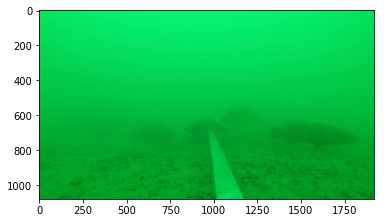

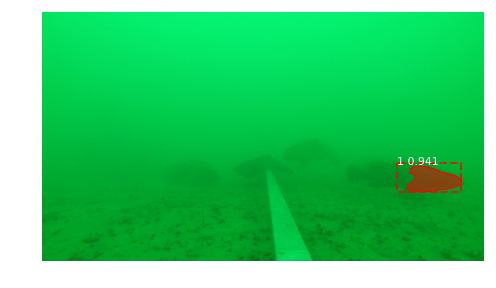

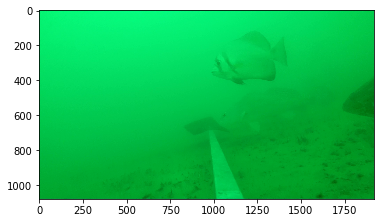

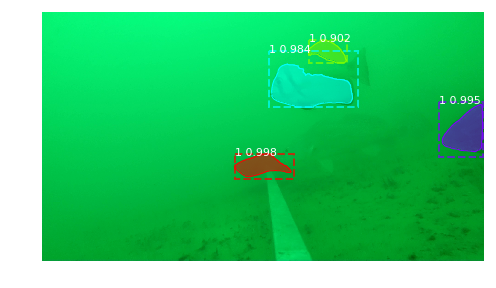

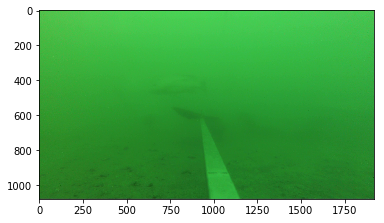

...

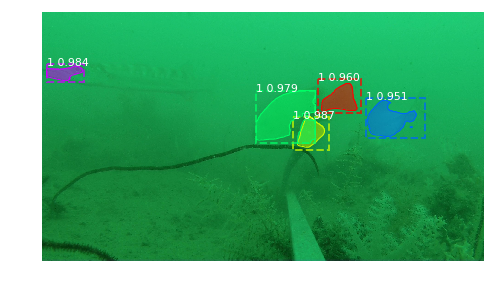

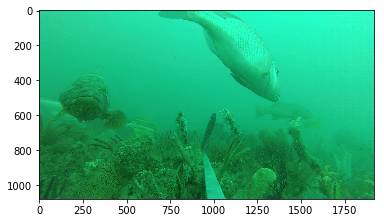

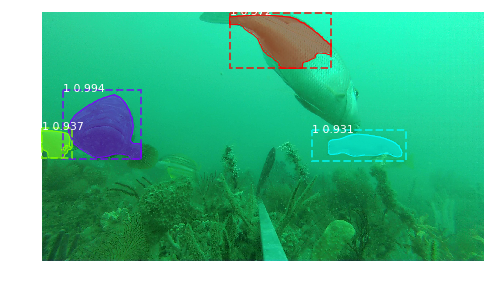

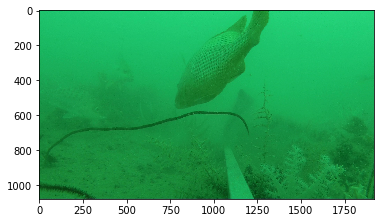

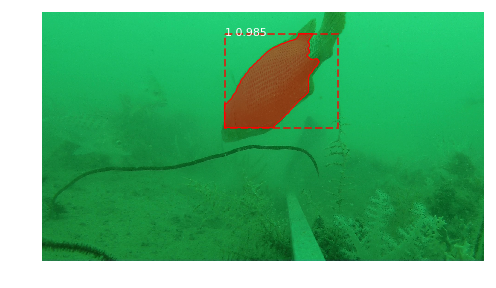

In [31]:
test_set = glob.glob(os.path.join('frames' , 'test', '*.jpg'))

for test in test_set:
    original_image = plt.imread(test)
    plt.imshow(original_image)
    plt.show()
    results = model.detect([original_image])

    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'], ax=get_ax())